In [1]:
import timm
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import matplotlib.pyplot as plt
import numpy as np
import time
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
from torch.optim.lr_scheduler import CosineAnnealingLR

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))]
    )


In [2]:
# Load CIFAR-10 dataset
# Load CIFAR-10 dataset
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
# Split training set into training and validation
train_size = int(0.8 * len(trainset))
val_size = len(trainset) - train_size
trainset, valset = torch.utils.data.random_split(trainset, [train_size, val_size])

trainloader = torch.utils.data.DataLoader(trainset, batch_size=32, shuffle=True, num_workers=8)
valloader = torch.utils.data.DataLoader(valset, batch_size=32, shuffle=False, num_workers=8)

testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=32, shuffle=False, num_workers=8)

# CIFAR-10 classes
classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

## 4. Model Setup

# Load pre-trained models
vit_model = timm.create_model('vit_base_patch32_224', pretrained=True)
swin_model = timm.create_model('swin_base_patch4_window7_224.ms_in1k', pretrained=True)


# Modify classification heads
# For ViT
vit_model.head = nn.Linear(vit_model.head.in_features, 10)

# For SWIN: Custom head with correct pooling and feature handling
class SwinHead(nn.Module):
    def __init__(self, in_channels, num_classes):
        super(SwinHead, self).__init__()
        self.global_pool = nn.AdaptiveAvgPool2d(1)  # Reduce [batch, C, H, W] to [batch, C, 1, 1]
        self.fc = nn.Linear(in_channels, num_classes)  # Map to num_classes

    def forward(self, x):
        #print(f"Feature map shape before permute: {x.shape}")  # Debug
        # Transpose from [batch, H, W, C] to [batch, C, H, W]
        x = x.permute(0, 3, 1, 2)
        #print(f"Feature map shape after permute: {x.shape}")  # Debug
        x = self.global_pool(x)  # Shape: [batch, C, 1, 1]
        x = x.flatten(1)  # Shape: [batch, C]
        #print(f"Shape after flattening: {x.shape}")  # Debug
        x = self.fc(x)  # Shape: [batch, num_classes]
        return x

# Debug: Inspect SWIN model feature dimension
#dummy_input = torch.randn(1, 3, 224, 224).to(torch.device("cuda" if torch.cuda.is_available() else "cpu"))
#swin_model.eval()
#with torch.no_grad():
#    feature_map = swin_model.forward_features(dummy_input)
#    print(f"SWIN feature map shape: {feature_map.shape}")

# Apply custom head to SWIN (assuming 1024 channels, adjusted if debug shows otherwise)
swin_model.head = SwinHead(in_channels=1024, num_classes=10)

# Move models to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vit_model.to(device)
swin_model.to(device)

SwinTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
    (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
  )
  (layers): Sequential(
    (0): SwinTransformerStage(
      (downsample): Identity()
      (blocks): Sequential(
        (0): SwinTransformerBlock(
          (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
          (attn): WindowAttention(
            (qkv): Linear(in_features=128, out_features=384, bias=True)
            (attn_drop): Dropout(p=0.0, inplace=False)
            (proj): Linear(in_features=128, out_features=128, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
            (softmax): Softmax(dim=-1)
          )
          (drop_path1): Identity()
          (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
          (mlp): Mlp(
            (fc1): Linear(in_features=128, out_features=512, bias=True)
            (act): GELU(approximate='none')
            (

In [3]:
def setup_model_training(model, option="full_finetune"):
    """
    Set up model for training with different fine-tuning strategies
    
    Args:
        model: The model to configure
        option: "full_finetune" or "head_only"
        
    Returns:
        Parameters to be optimized
    """
    if option == "full_finetune":
        # Fine-tune the entire model
        return model.parameters()
    
    elif option == "head_only":
        # Freeze the backbone parameters
        for name, param in model.named_parameters():
            param.requires_grad = False
            
        # For ViT model
        if hasattr(model, 'head'):
            # Unfreeze only the head
            for param in model.head.parameters():
                param.requires_grad = True
        
        # For Swin model (custom head and potentially last layer)
        else:
            # Unfreeze the custom head
            for param in model.head.parameters():
                param.requires_grad = True
            
            # Optionally unfreeze the last transformer block for better adaptation
            if hasattr(model, 'layers') and len(model.layers) > 0:
                last_layer = model.layers[-1]
                for param in last_layer.parameters():
                    param.requires_grad = True
        
        # Return only parameters that require gradients
        return filter(lambda p: p.requires_grad, model.parameters())

In [ ]:
def save_model(model, model_type, fine_tune_type):
    """
    Save the model with a naming convention indicating the fine-tuning method
    
    Args:
        model: The model to save
        model_type: "vit" or "swin"
        fine_tune_type: "full_finetune" or "head_only"
    """
    # Create a directory for the specific method
    method_dir = f"saved_models/{model_type}_{fine_tune_type}"
    import os
    if not os.path.exists(method_dir):
        os.makedirs(method_dir)
    
    # Create the filename
    filename = f"{method_dir}/model_weights.pth"
    
    # Save the model
    torch.save(model.state_dict(), filename)
    print(f"Model saved to {filename}")


In [ ]:
# Define evaluation function
def evaluate_model(model, dataloader, criterion=None, compute_metrics=True, 
                  plot_confusion=False, model_name="model",save_dir="model"):
    model.eval()
    all_preds = []
    all_labels = []
    running_loss = 0.0
    correct = 0
    total = 0
    method_dir = f"saved_models/{save_dir}"
    import os
    if not os.path.exists(method_dir):
        os.makedirs(method_dir)
    # Measure inference time
    inference_time = 0
    num_batches = 0
    
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            # Measure inference time
            start_time = time.time()
            outputs = model(inputs)
            end_time = time.time()
            inference_time += (end_time - start_time)
            num_batches += 1
            
            # Calculate loss if criterion provided
            if criterion is not None:
                loss = criterion(outputs, labels)
                running_loss += loss.item()
            
            # Calculate accuracy
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            # Store predictions and labels for confusion matrix
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    # Calculate metrics
    accuracy = 100 * correct / total
    error_rate = 100 - accuracy
    
    # Calculate average loss if criterion was provided
    avg_loss = 0
    if criterion is not None:
        avg_loss = running_loss / len(dataloader)
    
    # Calculate average inference time per batch
    avg_inference_time = inference_time / num_batches
    
    if compute_metrics:
        print(f"\n--- {model_name} Evaluation Results ---")
        print(f"Accuracy: {accuracy:.2f}%")
        print(f"Top-1 Error Rate: {error_rate:.2f}%")
        print(f"Average Inference Time per Batch: {avg_inference_time*1000:.2f} ms")
        
        # Display classification report
        print("\nClassification Report:")
        report = classification_report(all_labels, all_preds, 
                                      target_names=classes, 
                                      digits=3)
        print(report)
        
        # Plot confusion matrix
        if plot_confusion:
            cm = confusion_matrix(all_labels, all_preds)
            plt.figure(figsize=(10, 8))
            sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                        xticklabels=classes, yticklabels=classes)
            plt.xlabel('Predicted Labels')
            plt.ylabel('True Labels')
            plt.title(f'{model_name} - Confusion Matrix')
            plt.tight_layout()
            plt.savefig(f"{method_dir}/{save_dir}_confusion_matrix.png")
            plt.show()
            # Calculate per-class accuracy
            class_accuracy = np.diag(cm) / np.sum(cm, axis=1)
            
            # Plot per-class accuracy
            plt.figure(figsize=(12, 6))
            plt.bar(classes, class_accuracy * 100)
            plt.xlabel('Class')
            plt.ylabel('Accuracy (%)')
            plt.title(f'{model_name} - Per-Class Accuracy')
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.savefig(f"{method_dir}/{save_dir}_per_class_accuracy.png")
            plt.show()
            # Return evaluation metrics
            evaluation_metrics = {
                'accuracy': accuracy,
                'error_rate': error_rate,
                'inference_time': avg_inference_time,
                'confusion_matrix': cm,
                'per_class_accuracy': class_accuracy
            }
            
            return avg_loss, accuracy, evaluation_metrics
    return avg_loss, accuracy

In [6]:
## 5. Training Function
def train_model(model, trainloader, valloader, criterion, optimizer, 
                num_epochs=5, model_name="model", save_dir="saved_models"):
    # Initialize tracking variables
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    best_val_acc = 0.0
    learning_rates = []
    
    # Create learning rate scheduler with cosine annealing
    scheduler = CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)
    method_dir = f"{save_dir}/{model_name}" if save_dir != model_name else f"saved_models/{model_name}"
    import os
    if not os.path.exists(method_dir):
        os.makedirs(method_dir)
    
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        epoch_start_time = time.time()
        
        for inputs, labels in trainloader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            
            # Calculate accuracy
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        # Update learning rate with scheduler
        current_lr = optimizer.param_groups[0]['lr']
        learning_rates.append(current_lr)
        scheduler.step()
        
        # Calculate training metrics
        epoch_train_loss = running_loss/len(trainloader)
        epoch_train_acc = 100 * correct / total
        train_losses.append(epoch_train_loss)
        train_accs.append(epoch_train_acc)
        epoch_time = time.time() - epoch_start_time
        
        # Validation phase
        val_loss, val_acc = evaluate_model(model, valloader, criterion, compute_metrics=False)
        val_losses.append(val_loss)
        val_accs.append(val_acc)
        
        print(f'Epoch {epoch+1}/{num_epochs}:')
        print(f'  Train Loss: {epoch_train_loss:.4f} | Train Acc: {epoch_train_acc:.2f}%')
        print(f'  Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%')
        print(f'  Learning Rate: {current_lr:.7f}')
        print(f'  Time: {epoch_time:.2f}s')
        
        # Save checkpoint if best validation accuracy
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save({
                'epoch': epoch + 1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'val_acc': val_acc,
                'train_acc': epoch_train_acc,
            }, f"{method_dir}/best_checkpoint.pth")
            print(f'  New best model saved! Validation accuracy: {val_acc:.2f}%')
    
    # Save the final model
    torch.save({
        'epoch': num_epochs,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'val_acc': val_accs[-1],
        'train_acc': train_accs[-1],
    }, f"{method_dir}/final_checkpoint.pth")
    
    # Plot training curves
    plt.figure(figsize=(15, 10))
    
    # Loss plot
    plt.subplot(2, 2, 1)
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title(f'{model_name} - Loss Curves')
    
    # Accuracy plot
    plt.subplot(2, 2, 2)
    plt.plot(train_accs, label='Training Accuracy')
    plt.plot(val_accs, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    plt.title(f'{model_name} - Accuracy Curves')
    
    # Learning rate plot
    plt.subplot(2, 2, 3)
    plt.plot(learning_rates, marker='o')
    plt.xlabel('Epochs')
    plt.ylabel('Learning Rate')
    plt.title(f'{model_name} - Learning Rate Schedule')
    plt.yscale('log')
    
    plt.tight_layout()
    plt.savefig(f"{method_dir}/training_curves.png")
    
    return {
        'train_losses': train_losses,
        'train_accs': train_accs,
        'val_losses': val_losses, 
        'val_accs': val_accs,
        'learning_rates': learning_rates
    }



# Define loss function and optimizers
criterion = nn.CrossEntropyLoss()


In [7]:
def analyze_model_complexity(model, input_size=(3, 224, 224), batch_size=1):
    """
    Analyze model complexity and computational efficiency
    """
    # Count number of parameters
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    
    # Measure memory usage
    dummy_input = torch.randn(batch_size, *input_size).to(device)
    
    # Measure inference time for a single forward pass
    model.eval()
    with torch.no_grad():
        # Warm up
        for _ in range(10):
            _ = model(dummy_input)
        
        # Actual measurement
        torch.cuda.synchronize()
        start_time = time.time()
        for _ in range(100):
            _ = model(dummy_input)
        torch.cuda.synchronize()
        end_time = time.time()
        
    inference_time = (end_time - start_time) / 100
    
    # Print results
    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")
    print(f"Inference time (batch_size={batch_size}): {inference_time*1000:.2f} ms")
    
    return {
        'total_params': total_params,
        'trainable_params': trainable_params,
        'inference_time': inference_time
    }

In [8]:
def clear_gpu_memory():
    """
    Clear GPU memory to prevent out-of-memory errors between training sessions.
    """
    import gc
    # Clear PyTorch cache
    torch.cuda.empty_cache()
    
    # Force garbage collection
    gc.collect()
    
    # Print memory stats if needed (for debugging)
    if torch.cuda.is_available():
        print(f"GPU Memory allocated: {torch.cuda.memory_allocated() / 1024**2:.2f} MB")
        print(f"GPU Memory cached: {torch.cuda.memory_reserved() / 1024**2:.2f} MB")

In [9]:
# import timm
# import torch
# import torch.nn as nn
# import torchvision
# import torchvision.transforms as transforms
# from pytorch_grad_cam.utils.image import show_cam_on_image
# import matplotlib.pyplot as plt
# import numpy as np

# # Define CIFAR-10 classes and data loading
# classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

# transform = transforms.Compose([
#     transforms.Resize((224, 224)),
#     transforms.ToTensor(),
#     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
# ])

# # Load a small subset of test data
# testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
# testloader = torch.utils.data.DataLoader(testset, batch_size=32, shuffle=True, num_workers=2)

# # Setup device
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# # Define the custom GradCAM function
# def simple_grad_cam(model, layer, input_tensor, class_idx=None):
#     """
#     A simplified GradCAM implementation that works with both ViT and CNN architectures
#     """
#     # Register hooks to get activations and gradients
#     activations = []
#     gradients = []
    
#     def forward_hook(module, input, output):
#         activations.append(output)
    
#     def backward_hook(module, grad_input, grad_output):
#         gradients.append(grad_output[0])
    
#     # Register hooks
#     handle_forward = layer.register_forward_hook(forward_hook)
#     handle_backward = layer.register_full_backward_hook(backward_hook)
    
#     # Forward pass
#     model.eval()
#     model.zero_grad()
#     outputs = model(input_tensor)
    
#     # If no target class specified, use the predicted class
#     if class_idx is None:
#         _, class_idx = torch.max(outputs, 1)
#         class_idx = class_idx.item()
    
#     # Backward pass to get gradients
#     target = outputs[0, class_idx]
#     target.backward()
    
#     # Remove hooks
#     handle_forward.remove()
#     handle_backward.remove()
    
#     # Get activation and gradient
#     activation = activations[0]
#     gradient = gradients[0]
    
#     # Print tensor shapes for debugging
#     print(f"Activation shape: {activation.shape}")
#     print(f"Gradient shape: {gradient.shape}")
    
#     # Detect if we're using a ViT model based on tensor dimensions
#     is_vit = len(activation.shape) <= 3
    
#     if is_vit:
#         # For ViT models (typically [batch_size, num_tokens, embedding_dim])
#         # Use attention rollout or attention map visualization instead
#         # Simple approach: use the attention map directly as the CAM
#         cam = torch.mean(activation, dim=-1)  # Average over the embedding dimension
        
#         # Reshape to square for visualization (assuming square input)
#         side_length = int(np.sqrt(cam.size(1)))
#         cam = cam[0, 1:].reshape(side_length, side_length).detach().cpu().numpy()
        
#         # Interpolate to match input size
#         from scipy.ndimage import zoom
#         zoom_factor = 224 / cam.shape[0]
#         cam = zoom(cam, zoom_factor, order=1)
#     else:
#         # For CNN-like models (typically [batch_size, channels, height, width])
#         # Traditional GradCAM approach
#         weights = torch.mean(gradient, dim=(2, 3), keepdim=True)
#         cam = torch.sum(weights * activation, dim=1, keepdim=True)
#         cam = torch.nn.functional.relu(cam)  # ReLU to keep only positive influences
        
#         # Normalize heatmap
#         if torch.max(cam) > 0:
#             cam = cam / torch.max(cam)
        
#         # Resize to match input size
#         cam = torch.nn.functional.interpolate(
#             cam,
#             size=(224, 224),
#             mode='bilinear',
#             align_corners=False
#         ).squeeze().detach().cpu().numpy()
    
#     # Ensure the CAM is normalized
#     cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-7)
    
#     return cam

# # For SWIN model custom head
# class SwinHead(nn.Module):
#     def __init__(self, in_channels, num_classes):
#         super(SwinHead, self).__init__()
#         self.global_pool = nn.AdaptiveAvgPool2d(1)
#         self.fc = nn.Linear(in_channels, num_classes)

#     def forward(self, x):
#         x = x.permute(0, 3, 1, 2)
#         x = self.global_pool(x)
#         x = x.flatten(1)
#         x = self.fc(x)
#         return x

# # Get a few test samples
# def get_test_samples(testloader, num_samples=5):
#     """Get a few test samples with different labels"""
#     samples = []
#     labels_seen = set()
    
#     # Iterate through the dataloader until we have enough unique samples
#     for imgs, labels in testloader:
#         for i, label in enumerate(labels):
#             label_item = label.item()
#             # Only take one sample per class
#             if label_item not in labels_seen and len(samples) < num_samples:
#                 samples.append((imgs[i:i+1], label_item))
#                 labels_seen.add(label_item)
        
#         if len(samples) >= num_samples:
#             break
    
#     return samples

# # Load pretrained models
# def load_pretrained_models():
#     # Load pretrained ViT model
#     vit_model = timm.create_model('vit_base_patch32_224', pretrained=True)
#     vit_model.head = nn.Linear(vit_model.head.in_features, 10)  # Adapt for CIFAR-10
    
#     # Load pretrained SWIN model
#     swin_model = timm.create_model('swin_base_patch4_window7_224.ms_in1k', pretrained=True)
#     swin_model.head = SwinHead(in_channels=1024, num_classes=10)  # Adapt for CIFAR-10
    
#     # Move to device
#     vit_model = vit_model.to(device)
#     swin_model = swin_model.to(device)
    
#     return vit_model, swin_model

# # Test GradCAM visualization
# def test_grad_cam():
#     print("Loading pretrained models...")
#     vit_model, swin_model = load_pretrained_models()
    
#     print("Getting test samples...")
#     test_samples = get_test_samples(testloader, num_samples=5)
    
#     print("Setting up visualization...")
#     models = [vit_model, swin_model]
#     model_names = ["ViT", "SWIN"]
    
#     # Visualize GradCAM for each sample and model
#     fig, axes = plt.subplots(len(test_samples), len(models) + 1, figsize=(15, 3 * len(test_samples)))
    
#     for i, (image, label) in enumerate(test_samples):
#         image = image.to(device)
        
#         # Original image
#         orig_img = image.cpu().squeeze(0).numpy().transpose(1, 2, 0)
#         orig_img = orig_img * 0.5 + 0.5  # Denormalize
        
#         # Display original image
#         axes[i, 0].imshow(orig_img)
#         axes[i, 0].set_title(f'Original: {classes[label]}')
#         axes[i, 0].axis('off')
        
#         # For each model, generate Grad-CAM
#         for j, (model, model_name) in enumerate(zip(models, model_names)):
#             # Determine target layer based on model type
#             if "vit" in model_name.lower():
#                 target_layer = model.blocks[-1].norm1
#             else:  # swin
#                 target_layer = model.layers[-1].blocks[-1].norm1
            
#             print(f"Generating GradCAM for {model_name}, sample {i+1}/{len(test_samples)}")
#             try:
#                 # Get GradCAM using our custom implementation
#                 grayscale_cam = simple_grad_cam(model, target_layer, image, label)
#                 cam_image = show_cam_on_image(orig_img, grayscale_cam, use_rgb=True)
                
#                 # Get model prediction
#                 model.eval()
#                 with torch.no_grad():
#                     output = model(image)
#                     _, predicted = torch.max(output.data, 1)
#                     predicted_class = classes[predicted.item()]
#                     confidence = torch.nn.functional.softmax(output, dim=1)[0][predicted.item()].item() * 100
                
#                 # Display Grad-CAM
#                 axes[i, j + 1].imshow(cam_image)
#                 correct = "✓" if predicted.item() == label else "✗"
#                 axes[i, j + 1].set_title(f'{model_name}\nPred: {predicted_class} {correct}\nConf: {confidence:.1f}%')
#                 axes[i, j + 1].axis('off')
                
#                 print(f"  Success! Prediction: {predicted_class}, Actual: {classes[label]}")
#             except Exception as e:
#                 print(f"  Error generating GradCAM: {e}")
#                 axes[i, j + 1].text(0.5, 0.5, f"Error: {str(e)[:50]}...", 
#                                     ha='center', va='center', transform=axes[i, j + 1].transAxes)
#                 axes[i, j + 1].axis('off')
    
#     plt.tight_layout()
#     plt.savefig("gradcam_test_results.png")
#     print(f"Results saved to gradcam_test_results.png")
#     plt.show()

# # Run the test
# if __name__ == "__main__":
#     test_grad_cam()

Starting training and evaluation process...


=== Training Vision Transformer (full fine-tuning) ===
Epoch 1/20:
  Train Loss: 1.8064 | Train Acc: 33.13%
  Val Loss: 1.5481 | Val Acc: 42.19%
  Learning Rate: 0.0010000
  Time: 80.15s
  New best model saved! Validation accuracy: 42.19%
Epoch 2/20:
  Train Loss: 1.5276 | Train Acc: 43.86%
  Val Loss: 1.5097 | Val Acc: 45.36%
  Learning Rate: 0.0009939
  Time: 79.18s
  New best model saved! Validation accuracy: 45.36%
Epoch 3/20:
  Train Loss: 1.4183 | Train Acc: 48.35%
  Val Loss: 1.4323 | Val Acc: 47.43%
  Learning Rate: 0.0009756
  Time: 79.54s
  New best model saved! Validation accuracy: 47.43%
Epoch 4/20:
  Train Loss: 1.3202 | Train Acc: 51.88%
  Val Loss: 1.2755 | Val Acc: 53.84%
  Learning Rate: 0.0009456
  Time: 79.62s
  New best model saved! Validation accuracy: 53.84%
Epoch 5/20:
  Train Loss: 1.2302 | Train Acc: 55.62%
  Val Loss: 1.2764 | Val Acc: 54.57%
  Learning Rate: 0.0009046
  Time: 79.65s
  New best model saved! Validat

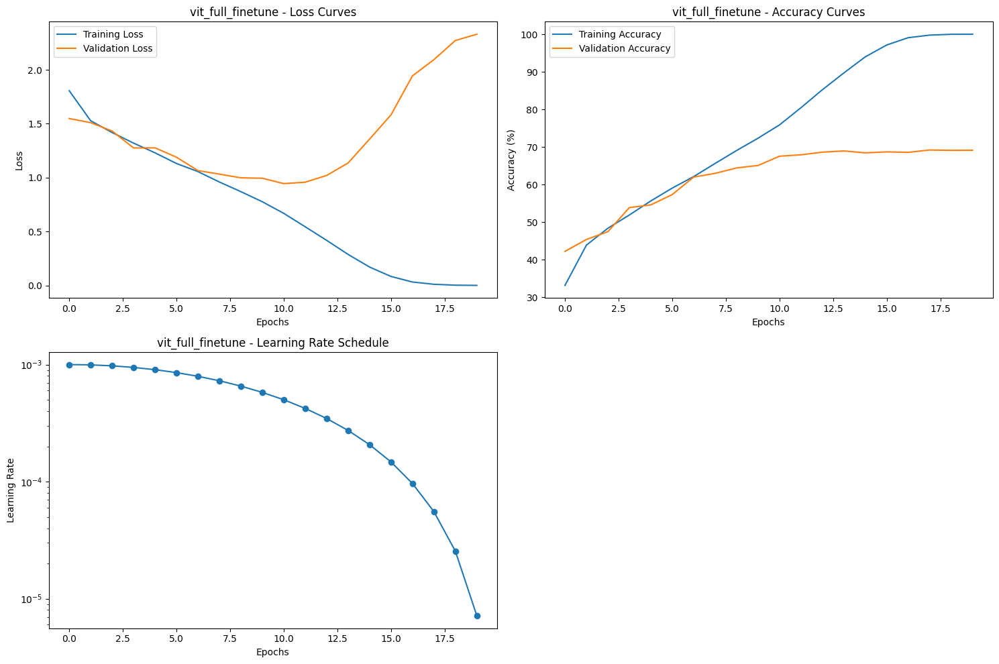

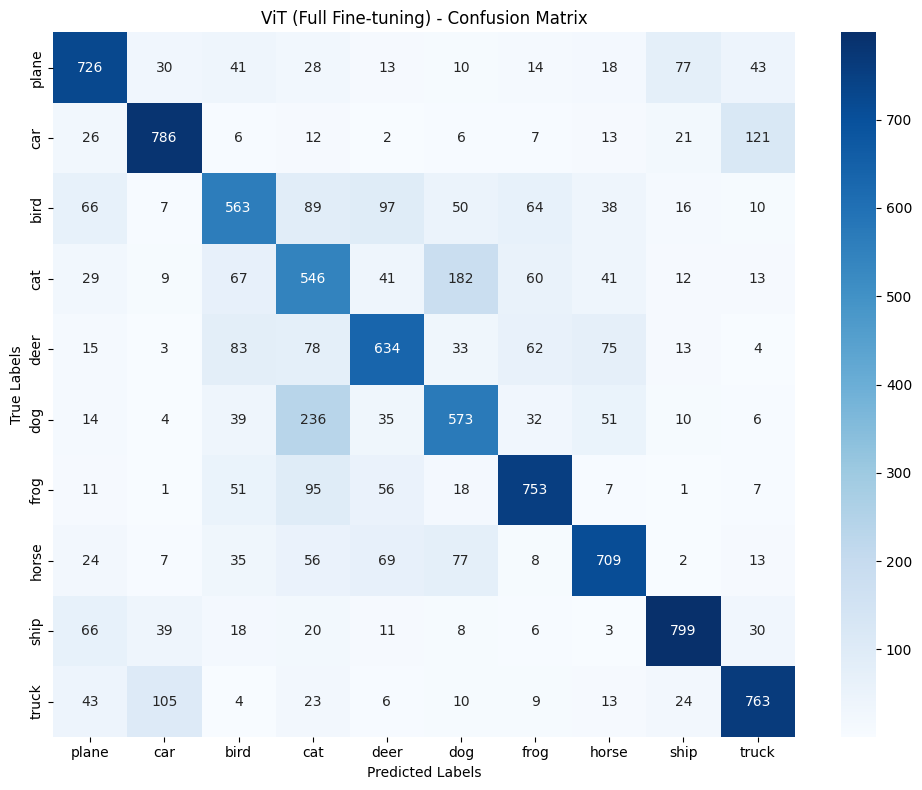

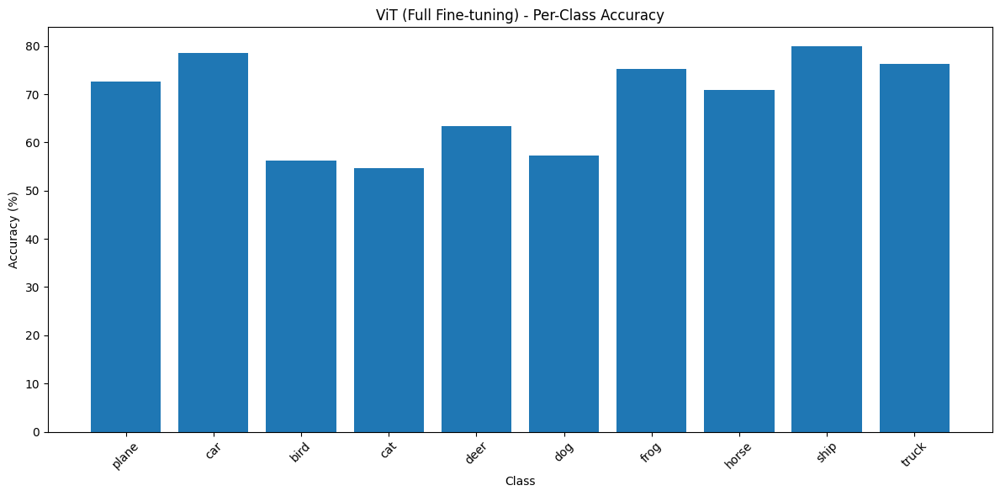

GPU Memory allocated: 3024.56 MB
GPU Memory cached: 3380.00 MB

=== Training Vision Transformer (head-only fine-tuning) ===
Epoch 1/20:
  Train Loss: 0.2453 | Train Acc: 91.95%
  Val Loss: 0.2145 | Val Acc: 93.05%
  Learning Rate: 0.0010000
  Time: 45.38s
  New best model saved! Validation accuracy: 93.05%
Epoch 2/20:
  Train Loss: 0.1740 | Train Acc: 94.19%
  Val Loss: 0.2065 | Val Acc: 93.41%
  Learning Rate: 0.0009939
  Time: 45.04s
  New best model saved! Validation accuracy: 93.41%
Epoch 3/20:
  Train Loss: 0.1550 | Train Acc: 94.73%
  Val Loss: 0.2025 | Val Acc: 93.40%
  Learning Rate: 0.0009756
  Time: 45.39s
Epoch 4/20:
  Train Loss: 0.1455 | Train Acc: 94.96%
  Val Loss: 0.2247 | Val Acc: 92.83%
  Learning Rate: 0.0009456
  Time: 45.29s
Epoch 5/20:
  Train Loss: 0.1337 | Train Acc: 95.45%
  Val Loss: 0.2036 | Val Acc: 93.53%
  Learning Rate: 0.0009046
  Time: 44.97s
  New best model saved! Validation accuracy: 93.53%
Epoch 6/20:
  Train Loss: 0.1292 | Train Acc: 95.50%
  Val L

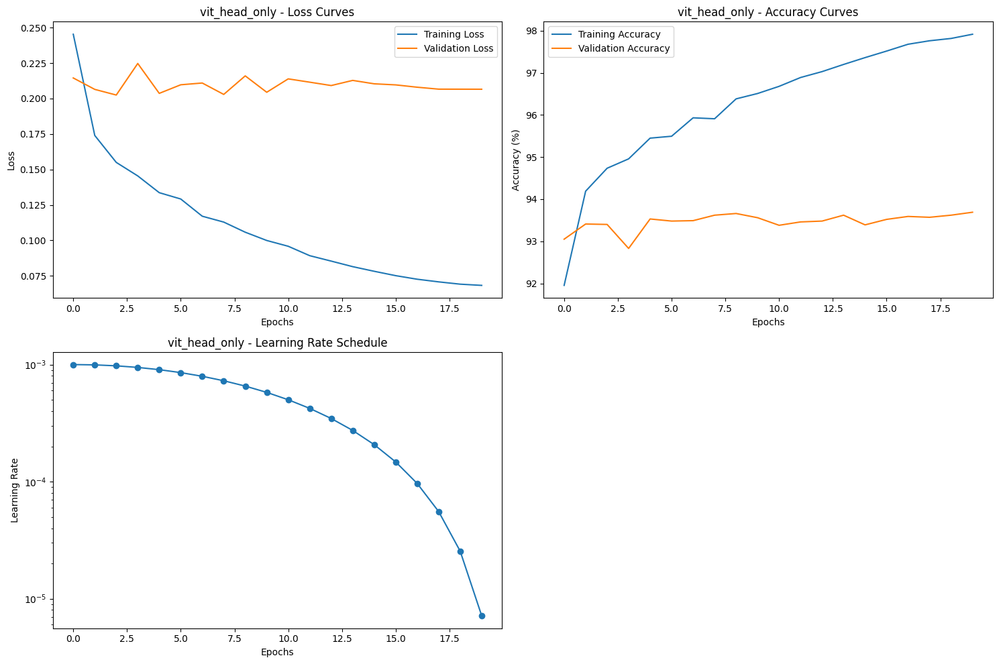

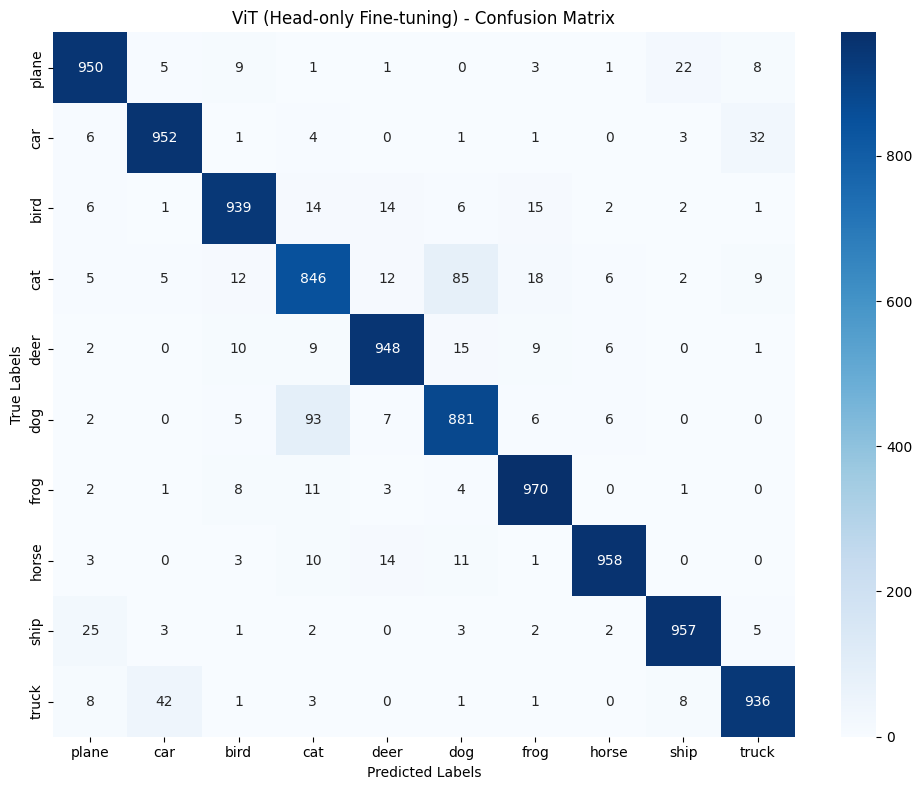

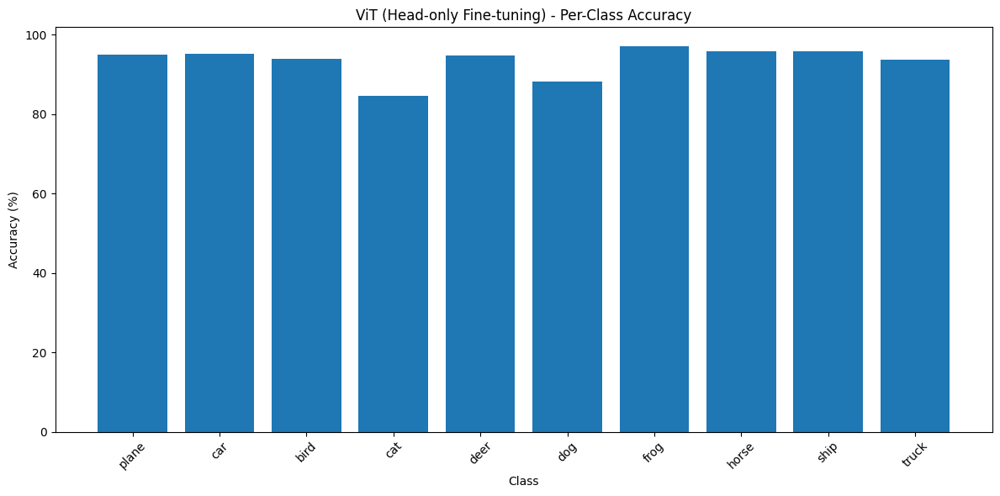

GPU Memory allocated: 3692.00 MB
GPU Memory cached: 4086.00 MB

=== Training SWIN Transformer (full fine-tuning) ===
Epoch 1/20:
  Train Loss: 2.2788 | Train Acc: 12.32%
  Val Loss: 2.3044 | Val Acc: 9.81%
  Learning Rate: 0.0010000
  Time: 221.35s
  New best model saved! Validation accuracy: 9.81%
Epoch 2/20:
  Train Loss: 2.3068 | Train Acc: 9.89%
  Val Loss: 2.3031 | Val Acc: 9.60%
  Learning Rate: 0.0009939
  Time: 221.59s
Epoch 3/20:
  Train Loss: 2.3061 | Train Acc: 10.02%
  Val Loss: 2.3043 | Val Acc: 10.15%
  Learning Rate: 0.0009756
  Time: 221.28s
  New best model saved! Validation accuracy: 10.15%
Epoch 4/20:
  Train Loss: 2.3057 | Train Acc: 9.65%
  Val Loss: 2.3037 | Val Acc: 9.60%
  Learning Rate: 0.0009456
  Time: 221.50s
Epoch 5/20:
  Train Loss: 2.3053 | Train Acc: 10.12%
  Val Loss: 2.3034 | Val Acc: 9.90%
  Learning Rate: 0.0009046
  Time: 221.73s
Epoch 6/20:
  Train Loss: 2.3047 | Train Acc: 9.80%
  Val Loss: 2.3031 | Val Acc: 9.60%
  Learning Rate: 0.0008537
  Time

c:\Users\Kevin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Kevin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Kevin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

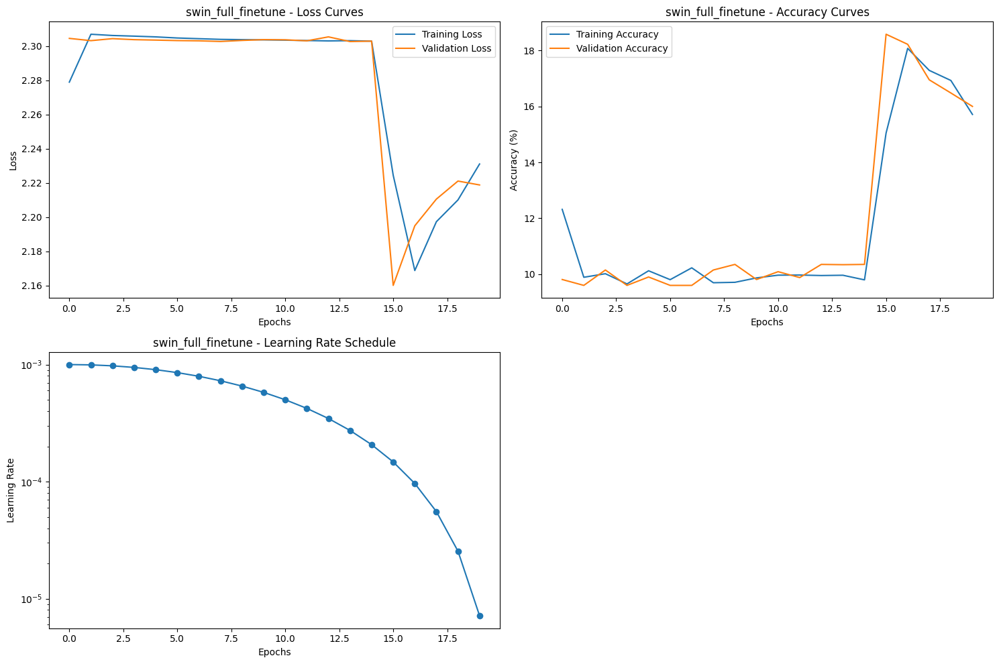

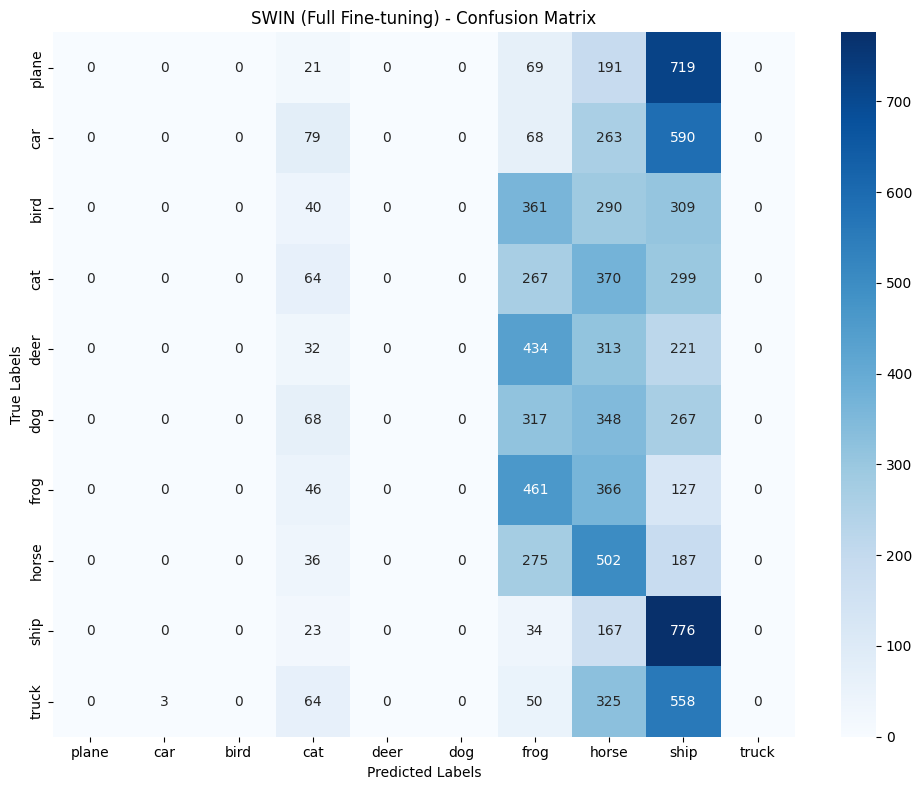

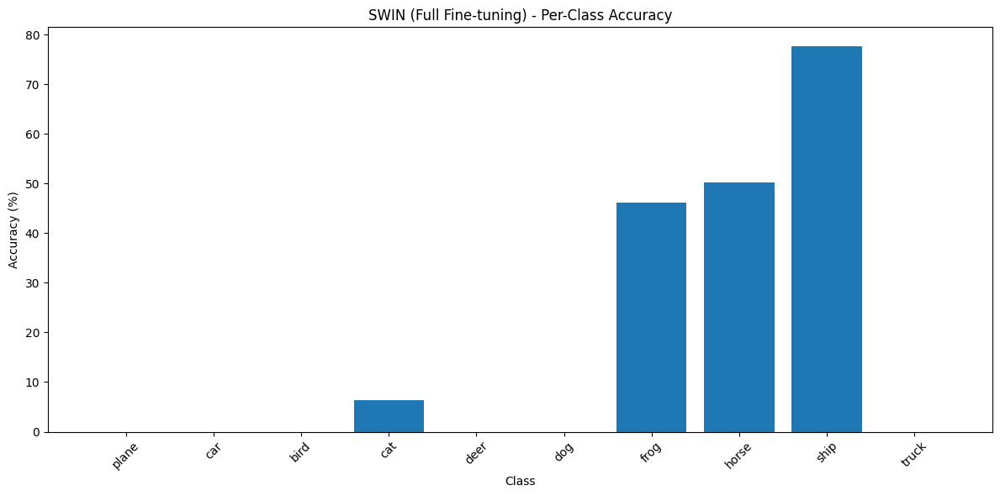

GPU Memory allocated: 6031.39 MB
GPU Memory cached: 7044.00 MB

=== Training SWIN Transformer (head-only fine-tuning) ===
Epoch 1/20:
  Train Loss: 0.2882 | Train Acc: 91.56%
  Val Loss: 0.2037 | Val Acc: 93.31%
  Learning Rate: 0.0010000
  Time: 97.91s
  New best model saved! Validation accuracy: 93.31%
Epoch 2/20:
  Train Loss: 0.1897 | Train Acc: 93.70%
  Val Loss: 0.1879 | Val Acc: 93.82%
  Learning Rate: 0.0009939
  Time: 97.54s
  New best model saved! Validation accuracy: 93.82%
Epoch 3/20:
  Train Loss: 0.1713 | Train Acc: 94.21%
  Val Loss: 0.1854 | Val Acc: 93.73%
  Learning Rate: 0.0009756
  Time: 97.78s
Epoch 4/20:
  Train Loss: 0.1627 | Train Acc: 94.52%
  Val Loss: 0.1906 | Val Acc: 93.56%
  Learning Rate: 0.0009456
  Time: 97.31s
Epoch 5/20:
  Train Loss: 0.1529 | Train Acc: 94.77%
  Val Loss: 0.1804 | Val Acc: 93.94%
  Learning Rate: 0.0009046
  Time: 97.86s
  New best model saved! Validation accuracy: 93.94%
Epoch 6/20:
  Train Loss: 0.1473 | Train Acc: 95.05%
  Val Los

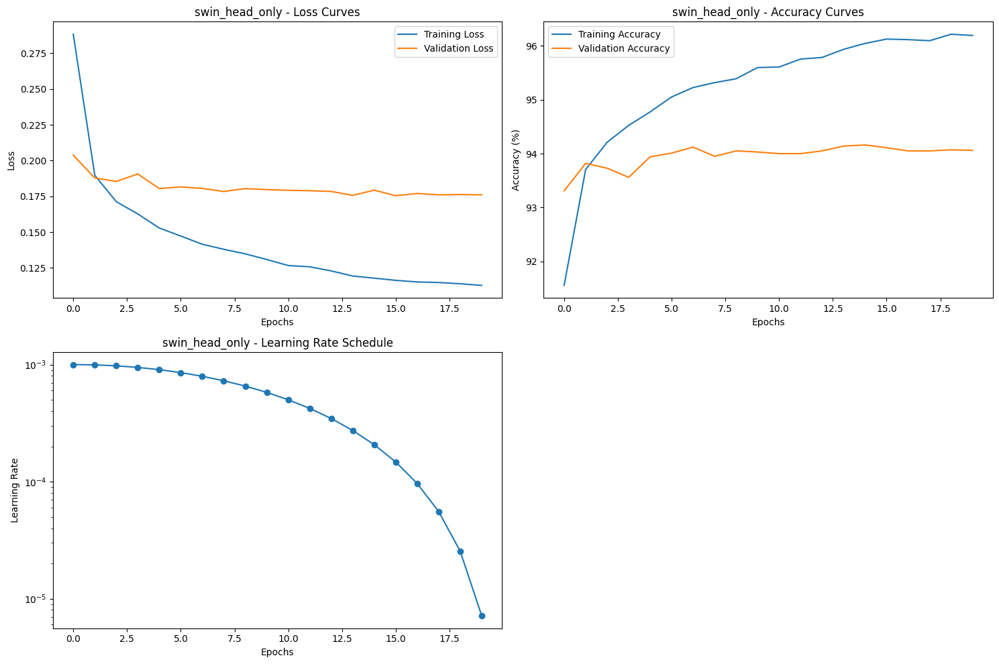

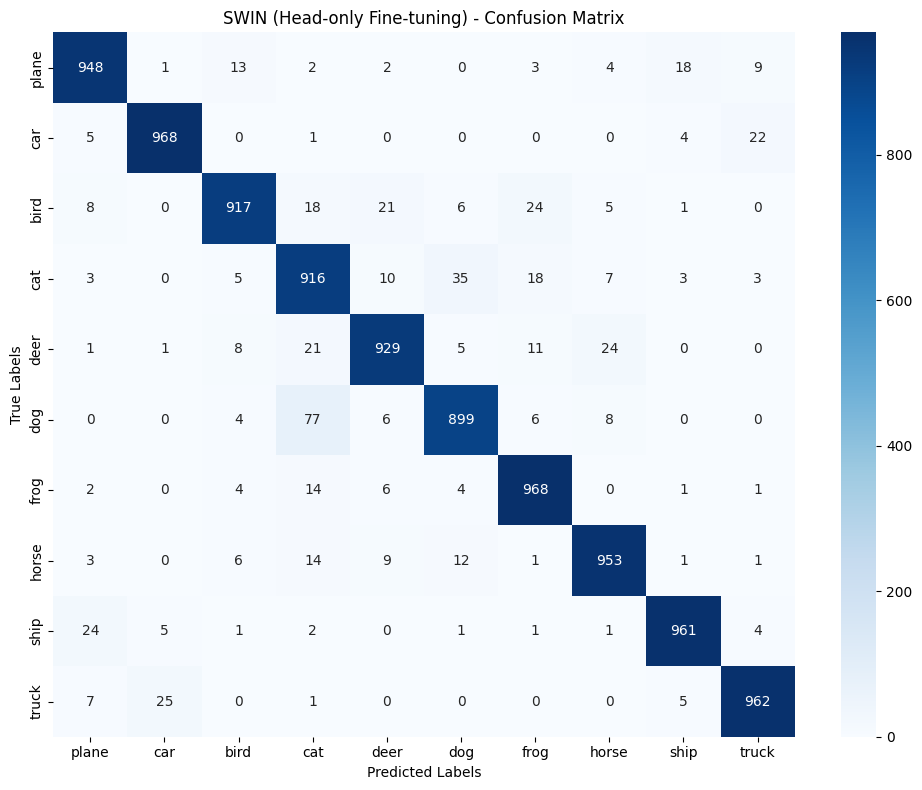

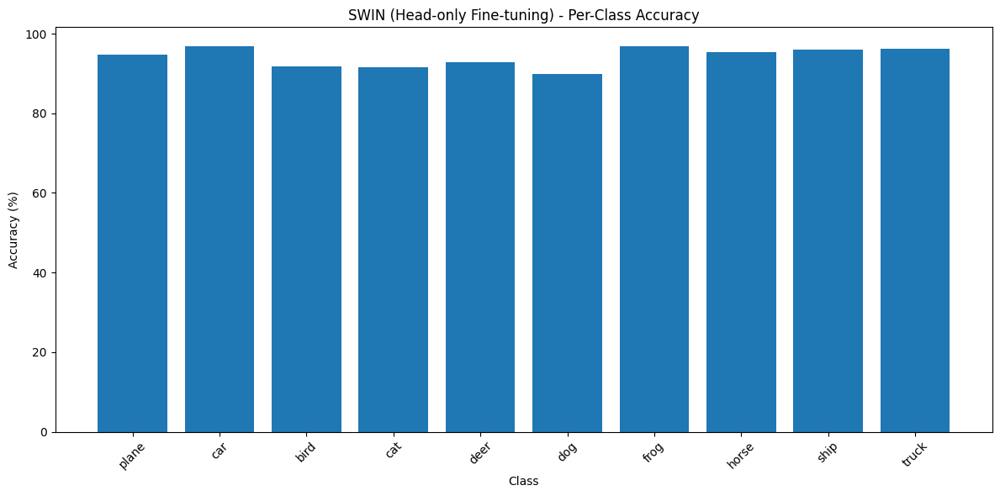

GPU Memory allocated: 6699.75 MB
GPU Memory cached: 7376.00 MB

=== Model Complexity Comparison ===

Vision Transformer (Full Fine-tuning):
Total parameters: 87,462,922
Trainable parameters: 87,462,922
Inference time (batch_size=1): 3.18 ms

Vision Transformer (Head-only Fine-tuning):
Total parameters: 87,462,922
Trainable parameters: 7,690
Inference time (batch_size=1): 3.75 ms

SWIN Transformer (Full Fine-tuning):
Total parameters: 86,753,474
Trainable parameters: 86,753,474
Inference time (batch_size=1): 14.06 ms

SWIN Transformer (Head-only Fine-tuning):
Total parameters: 86,753,474
Trainable parameters: 10,250
Inference time (batch_size=1): 14.03 ms

=== Comprehensive Comparison Summary ===

Performance Summary:
--------------------------------------------------------------------------------
Model                Test Accuracy   Top-1 Error     Parameters      Inference Time 
--------------------------------------------------------------------------------
ViT (Full)           68.52

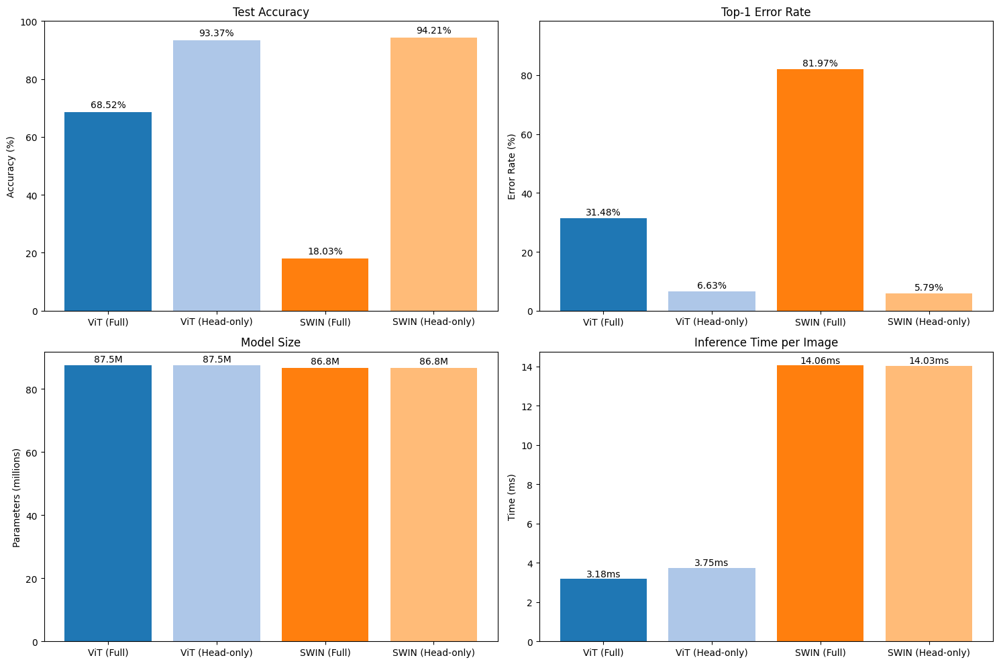

In [10]:
## 7. Evaluation with Saved Models

def load_and_evaluate_model(model_type, fine_tune_type):
    """
    Load a saved model and evaluate it
    
    Args:
        model_type: "vit" or "swin"
        fine_tune_type: "full_finetune" or "head_only"
    
    Returns:
        Loaded model and its accuracy
    """
    # Initialize the model architecture - match the exact models used in training
    if model_type == "vit":
        model = timm.create_model('vit_base_patch32_224', pretrained=False)
        model.head = nn.Linear(model.head.in_features, 10)
    else:  # swin
        model = timm.create_model('swin_base_patch4_window7_224.ms_in1k', pretrained=False)
        model.head = SwinHead(in_channels=1024, num_classes=10)
    
    # Load the saved weights
    model_path = f"saved_models/{model_type}_{fine_tune_type}/model_weights.pth"
    model.load_state_dict(torch.load(model_path))
    model.to(device)
    
    # Evaluate
    print(f"Evaluating {model_type.upper()} ({fine_tune_type})...")
    accuracy = evaluate_model(model, testloader)
    
    return model, accuracy

def main():
    print("Starting training and evaluation process...\n")
    
    # Define loss function
    criterion = nn.CrossEntropyLoss()
    
    # Train and evaluate ViT with full fine-tuning
    print("\n=== Training Vision Transformer (full fine-tuning) ===")
    vit_full_model = timm.create_model('vit_base_patch32_224', pretrained=True)
    vit_full_model.head = nn.Linear(vit_full_model.head.in_features, 10)
    vit_full_model.to(device)
    vit_full_params = setup_model_training(vit_full_model, "full_finetune")
    vit_full_optimizer = optim.AdamW(vit_full_params, lr=0.001)
    vit_full_history = train_model(vit_full_model, trainloader, valloader, criterion, 
                                   vit_full_optimizer, num_epochs=20, 
                                   model_name="vit_full_finetune")
    
    # Load the best model and evaluate
    vit_full_checkpoint = torch.load("saved_models/vit_full_finetune/best_checkpoint.pth")
    vit_full_model.load_state_dict(vit_full_checkpoint['model_state_dict'])
    _, _, vit_full_metrics = evaluate_model(vit_full_model, testloader, criterion, plot_confusion=True, 
                                          model_name="ViT (Full Fine-tuning)", save_dir="vit_full_finetune")
    clear_gpu_memory()

    # Train and evaluate ViT with head-only fine-tuning
    print("\n=== Training Vision Transformer (head-only fine-tuning) ===")
    vit_head_model = timm.create_model('vit_base_patch32_224', pretrained=True)
    vit_head_model.head = nn.Linear(vit_head_model.head.in_features, 10)
    vit_head_model.to(device)
    vit_head_params = setup_model_training(vit_head_model, "head_only")
    vit_head_optimizer = optim.AdamW(vit_head_params, lr=0.001)
    vit_head_history = train_model(vit_head_model, trainloader, valloader, criterion, 
                                   vit_head_optimizer, num_epochs=20, 
                                   model_name="vit_head_only", save_dir="vit_head_only")
    
    # Load the best model and evaluate
    vit_head_checkpoint = torch.load("saved_models/vit_head_only/best_checkpoint.pth")
    vit_head_model.load_state_dict(vit_head_checkpoint['model_state_dict'])
    _, _, vit_head_metrics = evaluate_model(vit_head_model, testloader, criterion, plot_confusion=True, 
                                          model_name="ViT (Head-only Fine-tuning)", save_dir="vit_head_only")
    clear_gpu_memory()

    # Train and evaluate SWIN with full fine-tuning
    print("\n=== Training SWIN Transformer (full fine-tuning) ===")
    swin_full_model = timm.create_model('swin_base_patch4_window7_224.ms_in1k', pretrained=True)
    swin_full_model.head = SwinHead(in_channels=1024, num_classes=10)
    swin_full_model.to(device)
    swin_full_params = setup_model_training(swin_full_model, "full_finetune")
    swin_full_optimizer = optim.AdamW(swin_full_params, lr=0.001)
    swin_full_history = train_model(swin_full_model, trainloader, valloader, criterion, 
                                    swin_full_optimizer, num_epochs=20, 
                                    model_name="swin_full_finetune", save_dir="swin_full_finetune")
    
    # Load the best model and evaluate
    swin_full_checkpoint = torch.load("saved_models/swin_full_finetune/best_checkpoint.pth")
    swin_full_model.load_state_dict(swin_full_checkpoint['model_state_dict'])
    _, _, swin_full_metrics = evaluate_model(swin_full_model, testloader, criterion, plot_confusion=True, 
                                           model_name="SWIN (Full Fine-tuning)")
    clear_gpu_memory()

    # Train and evaluate SWIN with head-only fine-tuning
    print("\n=== Training SWIN Transformer (head-only fine-tuning) ===")
    swin_head_model = timm.create_model('swin_base_patch4_window7_224.ms_in1k', pretrained=True)
    swin_head_model.head = SwinHead(in_channels=1024, num_classes=10)
    swin_head_model.to(device)
    swin_head_params = setup_model_training(swin_head_model, "head_only")
    swin_head_optimizer = optim.AdamW(swin_head_params, lr=0.001)
    swin_head_history = train_model(swin_head_model, trainloader, valloader, criterion, 
                                    swin_head_optimizer, num_epochs=20, 
                                    model_name="swin_head_only")
    
    # Load the best model and evaluate
    swin_head_checkpoint = torch.load("saved_models/swin_head_only/best_checkpoint.pth")
    swin_head_model.load_state_dict(swin_head_checkpoint['model_state_dict'])
    _, _, swin_head_metrics = evaluate_model(swin_head_model, testloader, criterion, plot_confusion=True, 
                                           model_name="SWIN (Head-only Fine-tuning)")
    clear_gpu_memory()

    # 10. Model Complexity Comparison
    print("\n=== Model Complexity Comparison ===")
    print("\nVision Transformer (Full Fine-tuning):")
    vit_full_complexity = analyze_model_complexity(vit_full_model)

    print("\nVision Transformer (Head-only Fine-tuning):")
    vit_head_complexity = analyze_model_complexity(vit_head_model)

    print("\nSWIN Transformer (Full Fine-tuning):")
    swin_full_complexity = analyze_model_complexity(swin_full_model)

    print("\nSWIN Transformer (Head-only Fine-tuning):")
    swin_head_complexity = analyze_model_complexity(swin_head_model)
    
    # Compare best ViT and SWIN models based on validation accuracy
    best_vit_acc = max(vit_full_checkpoint['val_acc'], vit_head_checkpoint['val_acc'])
    best_swin_acc = max(swin_full_checkpoint['val_acc'], swin_head_checkpoint['val_acc'])
    
    best_models = []
    best_model_names = []
    
    if vit_full_checkpoint['val_acc'] >= vit_head_checkpoint['val_acc']:
        best_models.append(vit_full_model)
        best_model_names.append("ViT (Full)")
    else:
        best_models.append(vit_head_model)
        best_model_names.append("ViT (Head-only)")
    
    if swin_full_checkpoint['val_acc'] >= swin_head_checkpoint['val_acc']:
        best_models.append(swin_full_model)
        best_model_names.append("SWIN (Full)")
    else:
        best_models.append(swin_head_model)
        best_model_names.append("SWIN (Head-only)")
    
    # 13. Comprehensive Comparison
    print("\n=== Comprehensive Comparison Summary ===")
    
    # Compare validation accuracies
    val_accuracies = [
        vit_full_checkpoint['val_acc'],
        vit_head_checkpoint['val_acc'],
        swin_full_checkpoint['val_acc'],
        swin_head_checkpoint['val_acc']
    ]
    
    # Compare test accuracies
    test_accuracies = [
        vit_full_metrics['accuracy'],
        vit_head_metrics['accuracy'],
        swin_full_metrics['accuracy'],
        swin_head_metrics['accuracy']
    ]
    
    # Compare error rates
    error_rates = [
        vit_full_metrics['error_rate'],
        vit_head_metrics['error_rate'],
        swin_full_metrics['error_rate'],
        swin_head_metrics['error_rate']
    ]
    
    # Create comparison data
    model_full_names = ["ViT (Full)", "ViT (Head-only)", "SWIN (Full)", "SWIN (Head-only)"]
    
    plt.figure(figsize=(15, 10))
    
    # Test accuracy comparison
    plt.subplot(2, 2, 1)
    bars = plt.bar(model_full_names, test_accuracies, color=['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78'])
    plt.ylabel('Accuracy (%)')
    plt.title('Test Accuracy')
    plt.ylim(0, 100)
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 1,
                 f'{height:.2f}%', ha='center', va='bottom')
    
    # Top-1 error rate comparison
    plt.subplot(2, 2, 2)
    bars = plt.bar(model_full_names, error_rates, color=['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78'])
    plt.ylabel('Error Rate (%)')
    plt.title('Top-1 Error Rate')
    plt.ylim(0, max(error_rates) * 1.2)
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                 f'{height:.2f}%', ha='center', va='bottom')
    
    # Parameter count comparison
    plt.subplot(2, 2, 3)
    param_counts = [
        vit_full_complexity['total_params'] / 1e6,
        vit_head_complexity['total_params'] / 1e6,
        swin_full_complexity['total_params'] / 1e6,
        swin_head_complexity['total_params'] / 1e6
    ]
    bars = plt.bar(model_full_names, param_counts, color=['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78'])
    plt.ylabel('Parameters (millions)')
    plt.title('Model Size')
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                 f'{height:.1f}M', ha='center', va='bottom')
    
    # Inference time comparison
    plt.subplot(2, 2, 4)
    inference_times = [
        vit_full_complexity['inference_time'] * 1000,
        vit_head_complexity['inference_time'] * 1000,
        swin_full_complexity['inference_time'] * 1000,
        swin_head_complexity['inference_time'] * 1000
    ]
    bars = plt.bar(model_full_names, inference_times, color=['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78'])
    plt.ylabel('Time (ms)')
    plt.title('Inference Time per Image')
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.02,
                 f'{height:.2f}ms', ha='center', va='bottom')
    
    plt.tight_layout()
    comparison_dir = "saved_models/comparisons"
    import os
    if not os.path.exists(comparison_dir):
        os.makedirs(comparison_dir)

    plt.savefig(f"{comparison_dir}/comprehensive_comparison.png")
    
    # Create a summary table
    summary_data = {
        'Model': model_full_names,
        'Test Accuracy (%)': [f"{acc:.2f}" for acc in test_accuracies],
        'Top-1 Error (%)': [f"{err:.2f}" for err in error_rates],
        'Parameters (M)': [f"{p:.1f}" for p in [
            vit_full_complexity['total_params'] / 1e6, 
            vit_head_complexity['total_params'] / 1e6, 
            swin_full_complexity['total_params'] / 1e6, 
            swin_head_complexity['total_params'] / 1e6
        ]],
        'Inference (ms)': [f"{t*1000:.2f}" for t in [
            vit_full_complexity['inference_time'], 
            vit_head_complexity['inference_time'],
            swin_full_complexity['inference_time'], 
            swin_head_complexity['inference_time']
        ]]
    }
    
    # Print summary table
    print("\nPerformance Summary:")
    print("-" * 80)
    print(f"{'Model':<20} {'Test Accuracy':<15} {'Top-1 Error':<15} {'Parameters':<15} {'Inference Time':<15}")
    print("-" * 80)
    for i in range(len(model_full_names)):
        print(f"{summary_data['Model'][i]:<20} {summary_data['Test Accuracy (%)'][i]:<15} "
              f"{summary_data['Top-1 Error (%)'][i]:<15} {summary_data['Parameters (M)'][i]:<15} "
              f"{summary_data['Inference (ms)'][i]:<15}")
    print("-" * 80)
    
    # Save the best overall model
    best_model_idx = test_accuracies.index(max(test_accuracies))
    best_model_name = model_full_names[best_model_idx]
    
    print(f"\nBest overall model: {best_model_name} with {max(test_accuracies):.2f}% accuracy")
    print("\nTraining and evaluation completed successfully!")

if __name__ == "__main__":
    main()

Running attention map visualization...
Loading trained models...
Loaded ViT (Full fine-tuning) model
Loaded ViT (Head-only fine-tuning) model
Loaded SWIN (Full fine-tuning) model
Loaded SWIN (Head-only fine-tuning) model
Getting test samples...
ViT GradCAM shape: (7, 7)
ViT GradCAM shape: (7, 7)
SWIN feature shape: torch.Size([1, 7, 7, 1024])
SWIN heatmap shape: (7, 7)
SWIN feature shape: torch.Size([1, 7, 7, 1024])
SWIN heatmap shape: (7, 7)
ViT GradCAM shape: (7, 7)
ViT GradCAM shape: (7, 7)
SWIN feature shape: torch.Size([1, 7, 7, 1024])
SWIN heatmap shape: (7, 7)
SWIN feature shape: torch.Size([1, 7, 7, 1024])
SWIN heatmap shape: (7, 7)
ViT GradCAM shape: (7, 7)
ViT GradCAM shape: (7, 7)
SWIN feature shape: torch.Size([1, 7, 7, 1024])
SWIN heatmap shape: (7, 7)
SWIN feature shape: torch.Size([1, 7, 7, 1024])
SWIN heatmap shape: (7, 7)
ViT GradCAM shape: (7, 7)
ViT GradCAM shape: (7, 7)
SWIN feature shape: torch.Size([1, 7, 7, 1024])
SWIN heatmap shape: (7, 7)
SWIN feature shape: to

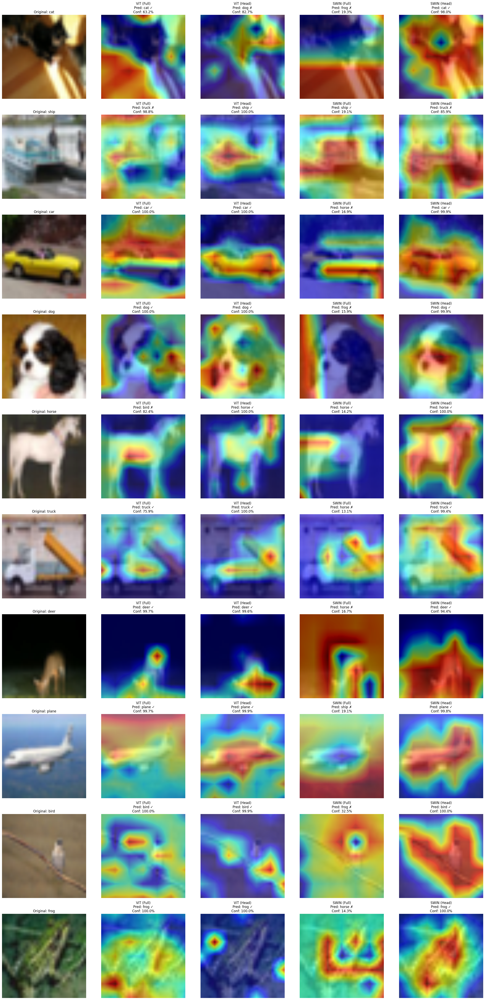


Running attention analysis...
Loading trained models...
Loaded ViT (Full fine-tuning) model
Loaded ViT (Head-only fine-tuning) model
Loaded SWIN (Full fine-tuning) model
Loaded SWIN (Head-only fine-tuning) model
Getting test samples...
Processing sample 1/10: class cat
ViT GradCAM shape: (7, 7)
  ViT (Full) - Mean: 0.42, Center/Edge: 0.39
ViT GradCAM shape: (7, 7)
  ViT (Head) - Mean: 0.23, Center/Edge: 2.78
SWIN feature shape: torch.Size([1, 7, 7, 1024])
SWIN heatmap shape: (7, 7)
  SWIN (Full) - Mean: 0.56, Center/Edge: 0.52
SWIN feature shape: torch.Size([1, 7, 7, 1024])
SWIN heatmap shape: (7, 7)
  SWIN (Head) - Mean: 0.56, Center/Edge: 1.28
Processing sample 2/10: class ship
ViT GradCAM shape: (7, 7)
  ViT (Full) - Mean: 0.51, Center/Edge: 1.28
ViT GradCAM shape: (7, 7)
  ViT (Head) - Mean: 0.25, Center/Edge: 3.69
SWIN feature shape: torch.Size([1, 7, 7, 1024])
SWIN heatmap shape: (7, 7)
  SWIN (Full) - Mean: 0.59, Center/Edge: 1.54
SWIN feature shape: torch.Size([1, 7, 7, 1024])

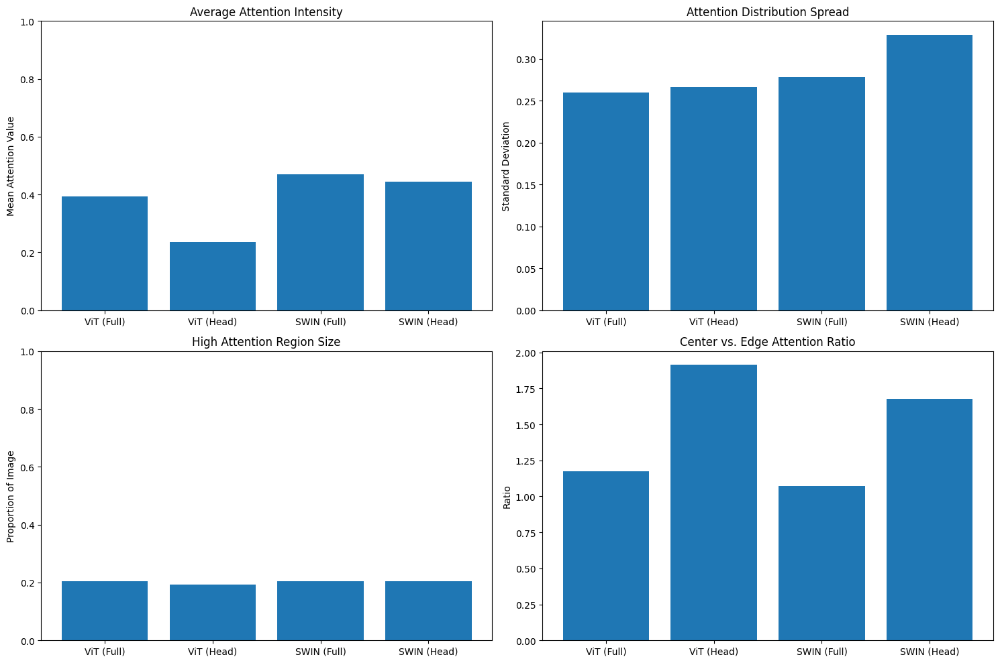

In [ ]:
import timm
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import os
import math
from scipy.ndimage import zoom
from PIL import Image

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# CIFAR-10 classes
classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

# Custom SWIN head class (keep this from your original code)
class SwinHead(nn.Module):
    def __init__(self, in_channels, num_classes):
        super(SwinHead, self).__init__()
        self.global_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(in_channels, num_classes)

    def forward(self, x):
        x = x.permute(0, 3, 1, 2)  # This is crucial for SWIN - converting [B,H,W,C] to [B,C,H,W]
        x = self.global_pool(x)
        x = x.flatten(1)
        x = self.fc(x)
        return x

# Transform functions for GradCAM
class ReshapeTransformViT:
    """Reshape transform for ViT models."""
    def __init__(self, model):
        # For standard ViT models from timm
        if hasattr(model, 'patch_embed'):
            if hasattr(model.patch_embed, 'img_size'):
                # For timm implementation
                input_size = model.patch_embed.img_size
                patch_size = model.patch_embed.patch_size
                if isinstance(input_size, tuple):
                    self.h = input_size[0] // patch_size[0]
                    self.w = input_size[1] // patch_size[1]
                else:
                    self.h = input_size // patch_size
                    self.w = input_size // patch_size
            else:
                # Fallback for older models or different implementations
                # Assuming square patches for a 224x224 image with patch_size 16 (14x14 grid)
                self.h = 14
                self.w = 14
        else:
            # Default for 224x224 image with 16x16 patches
            self.h = 14
            self.w = 14

    def __call__(self, x):
        # Remove cls token and reshape
        # [batch_size, num_tokens, token_dim]
        result = x[:, 1:, :].reshape(x.size(0),
                                     self.h,
                                     self.w,
                                     x.size(2))

        # Bring the channels to the first dimension,
        # like in CNNs.
        # [batch_size, H, W, C] -> [batch, C, H, W]
        result = result.permute(0, 3, 1, 2)
        return result

class ResizeTransformSwin:
    """Reshape transform for Swin transformer."""
    def __init__(self, im_h, im_w):
        self.height = self.feature_size(im_h)
        self.width = self.feature_size(im_w)

    @staticmethod
    def feature_size(s):
        s = math.ceil(s / 4)  # PatchEmbed
        s = math.ceil(s / 2)  # PatchMerging1
        s = math.ceil(s / 2)  # PatchMerging2
        s = math.ceil(s / 2)  # PatchMerging3
        return s

    def __call__(self, x):
        result = x.reshape(x.size(0),
                           self.height,
                           self.width,
                           x.size(2))

        # Bring the channels to the first dimension,
        # like in CNNs.
        # [batch_size, H, W, C] -> [batch, C, H, W]
        result = result.permute(0, 3, 1, 2)
        return result

# GradCAM implementation
class GradCAM:
    def __init__(self, model, target_layers, reshape_transform=None, use_cuda=False):
        self.model = model
        self.target_layers = target_layers
        self.reshape_transform = reshape_transform
        self.cuda = use_cuda
        self.activations = []
        self.gradients = []
        self.handles = []
        
        if self.cuda:
            self.model = model.cuda()
        
        # Register hooks
        self._register_hooks()
        
    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations.append(output)
        
        def backward_hook(module, grad_in, grad_out):
            self.gradients.append(grad_out[0])
        
        # Register forward and backward hooks
        for target_layer in self.target_layers:
            self.handles.append(target_layer.register_forward_hook(forward_hook))
            self.handles.append(target_layer.register_full_backward_hook(backward_hook))
    
    def __call__(self, input_tensor, target_category=None):
        if self.cuda:
            input_tensor = input_tensor.cuda()
        
        # Forward pass
        model_output = self.model(input_tensor)
        
        if target_category is None:
            target_category = torch.argmax(model_output, dim=1).item()
        
        # Zero gradients
        self.model.zero_grad()
        
        # Target for backprop
        one_hot = torch.zeros_like(model_output)
        one_hot[0, target_category] = 1
        
        # Backward pass
        model_output.backward(gradient=one_hot, retain_graph=True)
        
        # Get activations and reshape if needed
        activations = self.activations.pop()
        if self.reshape_transform is not None:
            activations = self.reshape_transform(activations)
        
        # Get gradients and reshape if needed
        gradients = self.gradients.pop()
        if self.reshape_transform is not None:
            gradients = self.reshape_transform(gradients)
        
        # Global average pooling of gradients
        weights = torch.mean(gradients, dim=[2, 3], keepdim=True)
        
        # Weight the activations
        cam = torch.sum(weights * activations, dim=1, keepdim=True)
        
        # ReLU and normalize
        cam = torch.relu(cam)
        cam = cam / (torch.max(cam) + 1e-7)
        
        # Resize to input size
        cam = cam.squeeze().cpu().data.numpy()
        
        return cam

# Utility functions
def center_crop_img(img, size):
    h, w = img.shape[0], img.shape[1]
    if h > size and w > size:
        j = int(round((h - size) / 2.))
        i = int(round((w - size) / 2.))
        img = img[j:j+size, i:i+size]
    return img

def show_cam_on_image(img, mask, use_rgb=False, colormap=plt.cm.jet):
    """
    Create a heatmap overlay using a mask on an image.
    
    Args:
        img: Original image (normalized to [0, 1])
        mask: Attention mask (normalized to [0, 1])
        use_rgb: Whether to use RGB colors or colormap
        colormap: Colormap to use
    """
    if len(img.shape) == 2:
        img = np.repeat(img[:, :, np.newaxis], 3, axis=2)
    
    # Resize mask to match image dimensions if needed
    if mask.shape[0] != img.shape[0] or mask.shape[1] != img.shape[1]:
        mask = zoom(mask, (img.shape[0] / mask.shape[0], img.shape[1] / mask.shape[1]), order=1)
    
    heatmap = colormap(mask)[:, :, :3]
    
    if use_rgb:
        cam_result = heatmap + img
        cam_result = cam_result / np.max(cam_result)
    else:
        cam_result = (heatmap * 0.3 + img * 0.7)
    
    return cam_result

# CIFAR-10 specific denormalization function
def denormalize_cifar10(image):
    """
    Restore images normalized using CIFAR-10 standardization parameters 
    (0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616) back to their original form.
    
    Args:
        image: Normalized image with shape [C, H, W] or [H, W, C]
    
    Returns:
        Denormalized image with values in the range 0-1
    """
    # Check if channels are in the first dimension
    is_chw = image.shape[0] == 3 and len(image.shape) == 3
    
    mean = np.array([0.4914, 0.4822, 0.4465])
    std = np.array([0.2470, 0.2435, 0.2616])
    
    if is_chw:
        # If the format is [C, H, W]
        for i in range(3):
            image[i] = image[i] * std[i] + mean[i]
    else:
        # If the format is [H, W, C]
        image = image * std + mean
    
    # Ensure values are within the range 0-1 
    # (some values might exceed the range due to numerical calculations)
    image = np.clip(image, 0, 1)
    
    return image

# Setup data for visualization
def setup_data():
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
    ])

    # Load a small subset of test data
    testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
    testloader = torch.utils.data.DataLoader(testset, batch_size=32, shuffle=True, num_workers=2)
    
    return testloader

def get_random_test_samples(testloader, num_samples=7, seed=42):
    """Get random samples from the test set, ensuring diversity of classes"""
    np.random.seed(seed)
    torch.manual_seed(seed)
    
    # Get diverse samples (one from each class if possible)
    samples_by_class = {}
    for images, labels in testloader:
        for i, label in enumerate(labels):
            label_idx = label.item()
            if label_idx not in samples_by_class and len(samples_by_class) < num_samples:
                samples_by_class[label_idx] = (images[i:i+1], label_idx)
        
        if len(samples_by_class) == num_samples:
            break
    
    # If we don't have enough classes, fill with random samples
    if len(samples_by_class) < num_samples:
        available_classes = list(samples_by_class.keys())
        additional_needed = num_samples - len(samples_by_class)
        
        for images, labels in testloader:
            for i, label in enumerate(labels):
                label_idx = label.item()
                if len(samples_by_class) < num_samples and label_idx in available_classes:
                    class_key = f"{label_idx}_additional_{len([k for k in samples_by_class if k == label_idx or str(k).startswith(str(label_idx)+'_')])}"
                    samples_by_class[class_key] = (images[i:i+1], label_idx)
            
            if len(samples_by_class) == num_samples:
                break
    
    return list(samples_by_class.values())

def load_trained_models():
    """Load all trained models"""
    models = {}
    model_names = []
    
    try:
        # Load ViT with full fine-tuning
        vit_full = timm.create_model('vit_base_patch32_224', pretrained=False)
        vit_full.head = nn.Linear(vit_full.head.in_features, 10)
        vit_full.load_state_dict(torch.load("saved_models/vit_full_finetune/best_checkpoint.pth")["model_state_dict"])
        vit_full.to(device)
        vit_full.eval()
        models["ViT (Full)"] = vit_full
        model_names.append("ViT (Full)")
        print("Loaded ViT (Full fine-tuning) model")
    except Exception as e:
        print(f"Error loading ViT full model: {e}")
    
    try:
        # Load ViT with head-only fine-tuning
        vit_head = timm.create_model('vit_base_patch32_224', pretrained=False)
        vit_head.head = nn.Linear(vit_head.head.in_features, 10)
        vit_head.load_state_dict(torch.load("saved_models/vit_head_only/best_checkpoint.pth")["model_state_dict"])
        vit_head.to(device)
        vit_head.eval()
        models["ViT (Head)"] = vit_head
        model_names.append("ViT (Head)")
        print("Loaded ViT (Head-only fine-tuning) model")
    except Exception as e:
        print(f"Error loading ViT head model: {e}")
    
    try:
        # Load SWIN with full fine-tuning
        swin_full = timm.create_model('swin_base_patch4_window7_224.ms_in1k', pretrained=False)
        swin_full.head = SwinHead(in_channels=1024, num_classes=10)
        swin_full.load_state_dict(torch.load("saved_models/swin_full_finetune/best_checkpoint.pth")["model_state_dict"])
        swin_full.to(device)
        swin_full.eval()
        models["SWIN (Full)"] = swin_full
        model_names.append("SWIN (Full)")
        print("Loaded SWIN (Full fine-tuning) model")
    except Exception as e:
        print(f"Error loading SWIN full model: {e}")
    
    try:
        # Load SWIN with head-only fine-tuning
        swin_head = timm.create_model('swin_base_patch4_window7_224.ms_in1k', pretrained=False)
        swin_head.head = SwinHead(in_channels=1024, num_classes=10)
        swin_head.load_state_dict(torch.load("saved_models/swin_head_only/best_checkpoint.pth")["model_state_dict"])
        swin_head.to(device)
        swin_head.eval()
        models["SWIN (Head)"] = swin_head
        model_names.append("SWIN (Head)")
        print("Loaded SWIN (Head-only fine-tuning) model")
    except Exception as e:
        print(f"Error loading SWIN head model: {e}")
    
    return models, model_names

def get_vit_gradcam(model, input_tensor, target_category=None):
    """
    Get GradCAM visualization for ViT model
    """
    # Use the last transformer block's norm1 layer for attention
    target_layers = [model.blocks[-1].norm1]
    
    try:
        cam = GradCAM(
            model=model,
            target_layers=target_layers,
            reshape_transform=ReshapeTransformViT(model),
            use_cuda=torch.cuda.is_available()
        )
        
        grayscale_cam = cam(input_tensor=input_tensor, target_category=target_category)
        
        # Debug information
        print(f"ViT GradCAM shape: {grayscale_cam.shape}")
        
        return grayscale_cam
    except Exception as e:
        print(f"Error in get_vit_gradcam: {e}")
        # Fallback to a simple approach
        with torch.no_grad():
            # Get features from the last block
            features = []
            def hook_fn(module, input, output):
                features.append(output)
            
            handle = model.blocks[-1].register_forward_hook(hook_fn)
            _ = model(input_tensor)
            handle.remove()
            
            if not features:
                # Create a default attention map
                return np.ones((7, 7)) * 0.5
            
            # Process features to get attention
            feature = features[0]  # Shape: [batch, tokens, channels]
            
            # Remove CLS token
            patch_features = feature[:, 1:, :]
            
            # Calculate importance using L2 norm
            importance = torch.norm(patch_features, dim=2)[0].cpu().numpy()
            
            # Reshape to spatial dimensions (assuming square image)
            size = int(np.sqrt(importance.shape[0]))
            heatmap = importance.reshape(size, size)
            
            # Normalize
            heatmap = heatmap - np.min(heatmap)
            heatmap = heatmap / np.max(heatmap) if np.max(heatmap) > 0 else heatmap
            
            print(f"Fallback ViT heatmap shape: {heatmap.shape}")
            
            return heatmap

def get_swin_gradcam(model, input_tensor, target_category=None):
    """
    Get GradCAM visualization for SWIN model
    """
    try:
        # Ensure input tensor is on the same device as the model
        model_device = next(model.parameters()).device
        input_tensor = input_tensor.to(model_device)
        
        # Extract features directly and use them as the attention map
        features = []
        
        def hook_fn(module, input, output):
            features.append(output)
            
        # Register hook on the final norm layer
        handle = model.norm.register_forward_hook(hook_fn)
        
        # Forward pass
        with torch.no_grad():
            _ = model(input_tensor)
        
        # Remove hook
        handle.remove()
        
        if not features:
            print("No features captured from SWIN model")
            return np.ones((7, 7)) * 0.5
        
        # Get feature tensor
        feature_tensor = features[0]
        print(f"SWIN feature shape: {feature_tensor.shape}")
        
        # SWIN features are typically [batch, h, w, channels] or [batch, h*w, channels]
        if len(feature_tensor.shape) == 3:
            # Shape is [batch, h*w, channels]
            # Reshape to spatial grid
            grid_size = int(np.sqrt(feature_tensor.shape[1]))
            feature_tensor = feature_tensor.reshape(feature_tensor.shape[0], grid_size, grid_size, feature_tensor.shape[2])
        
        # Calculate feature importance using L2 norm across channel dimension
        feature_importance = torch.norm(feature_tensor[0], dim=-1).cpu().numpy()
        
        # Normalize the attention map
        heatmap = feature_importance
        heatmap = heatmap - np.min(heatmap)
        heatmap = heatmap / np.max(heatmap) if np.max(heatmap) > 0 else heatmap
        
        print(f"SWIN heatmap shape: {heatmap.shape}")
        
        return heatmap
        
    except Exception as e:
        print(f"Error in get_swin_gradcam: {e}")
        # Return a default heatmap if everything fails
        return np.ones((7, 7)) * 0.5

def visualize_models_attention():
    """Generate and visualize attention maps for all models using GradCAM"""
    print("Loading trained models...")
    models, model_names = load_trained_models()
    
    if not models:
        print("No models were successfully loaded. Cannot continue with visualization.")
        return
    
    print("Getting test samples...")
    testloader = setup_data()
    samples = get_random_test_samples(testloader, num_samples=10)
    
    # Create output directory
    output_dir = "visualizations/attention_maps"
    os.makedirs(output_dir, exist_ok=True)
    
    # Create a figure for visualization
    fig, axes = plt.subplots(len(samples), len(models) + 1, figsize=(5*(len(models) + 1), 5*len(samples)))
    
    for i, (image, label) in enumerate(samples):
        # Original image
        image = image.to(device)
        orig_img = image.cpu().squeeze().numpy().transpose(1, 2, 0)
        
        orig_img = denormalize_cifar10(orig_img)
        
        # Display original image
        if len(samples) > 1:
            axes[i, 0].imshow(orig_img)
            axes[i, 0].set_title(f"Original: {classes[label]}", fontsize=12)
            axes[i, 0].axis('off')
        else:
            axes[0].imshow(orig_img)
            axes[0].set_title(f"Original: {classes[label]}", fontsize=12)
            axes[0].axis('off')
        
        # For each model, generate appropriate attention map
        for j, (model_name, model) in enumerate(models.items()):
            try:
                # Ensure model is in eval mode
                model.eval()
                
                # Use appropriate feature map based on model type
                if "swin" in model_name.lower():
                    grayscale_cam = get_swin_gradcam(model, image)
                else:
                    grayscale_cam = get_vit_gradcam(model, image)
                
                # Create overlay
                heatmap = show_cam_on_image(orig_img, grayscale_cam, use_rgb=True)
                
                # Get model prediction
                with torch.no_grad():
                    # Ensure input is on the same device as model
                    model_device = next(model.parameters()).device
                    img_input = image.to(model_device)
                    
                    output = model(img_input)
                    _, predicted = torch.max(output, 1)
                    probs = torch.nn.functional.softmax(output, dim=1)
                    confidence = probs[0, predicted.item()].item() * 100
                
                # Display result
                ax_idx = j + 1
                if len(samples) > 1:
                    axes[i, ax_idx].imshow(heatmap)
                    correct = "✓" if predicted.item() == label else "✗"
                    axes[i, ax_idx].set_title(
                        f"{model_name}\nPred: {classes[predicted.item()]} {correct}\nConf: {confidence:.1f}%", 
                        fontsize=12
                    )
                    axes[i, ax_idx].axis('off')
                else:
                    axes[ax_idx].imshow(heatmap)
                    correct = "✓" if predicted.item() == label else "✗"
                    axes[ax_idx].set_title(
                        f"{model_name}\nPred: {classes[predicted.item()]} {correct}\nConf: {confidence:.1f}%", 
                        fontsize=12
                    )
                    axes[ax_idx].axis('off')
                
            except Exception as e:
                print(f"Error processing {model_name} for sample {i}: {e}")
                # Display error message
                if len(samples) > 1:
                    axes[i, j+1].text(0.5, 0.5, f"Error: {str(e)[:50]}...", ha='center', va='center')
                    axes[i, j+1].axis('off')
                else:
                    axes[j+1].text(0.5, 0.5, f"Error: {str(e)[:50]}...", ha='center', va='center')
                    axes[j+1].axis('off')
    
    plt.tight_layout()
    plt.savefig(f"{output_dir}/attention_visualization.png", dpi=200, bbox_inches='tight')
    print(f"Saved attention visualizations to {output_dir}/attention_visualization.png")
    plt.show()

def analyze_feature_attention():
    """Analyze feature attention patterns from the models using GradCAM"""
    print("Loading trained models...")
    models, model_names = load_trained_models()
    
    if not models:
        print("No models were successfully loaded. Cannot continue with analysis.")
        return
    
    print("Getting test samples...")
    testloader = setup_data()
    samples = get_random_test_samples(testloader, num_samples=10)
    
    # Create output directory
    output_dir = "visualizations/attention_analysis"
    os.makedirs(output_dir, exist_ok=True)
    
    # Dictionary to store metrics
    attention_metrics = {model_name: [] for model_name in models.keys()}
    
    # Process each sample and model
    for i, (image, label) in enumerate(samples):
        print(f"Processing sample {i+1}/{len(samples)}: class {classes[label]}")
        
        for model_name, model in models.items():
            try:
                # Get appropriate feature map based on model type
                if "swin" in model_name.lower():
                    attention_map = get_swin_gradcam(model, image)
                else:
                    attention_map = get_vit_gradcam(model, image)
                
                # Calculate attention metrics
                attention_mean = np.mean(attention_map)
                attention_std = np.std(attention_map)
                
                # Find regions of high attention (top 20%)
                threshold = np.percentile(attention_map, 80)
                high_attention_mask = attention_map > threshold
                high_attention_region_size = np.sum(high_attention_mask) / attention_map.size
                
                # Calculate center vs edge attention
                h, w = attention_map.shape
                center_mask = np.zeros_like(attention_map, dtype=bool)
                center_h, center_w = h // 3, w // 3
                center_mask[center_h:2*center_h, center_w:2*center_w] = True
                
                center_attention = np.mean(attention_map[center_mask])
                edge_attention = np.mean(attention_map[~center_mask])
                center_edge_ratio = center_attention / edge_attention if edge_attention > 0 else 1.0
                
                # Store metrics
                attention_metrics[model_name].append({
                    'class': classes[label],
                    'attention_mean': attention_mean,
                    'attention_std': attention_std,
                    'high_attention_region': high_attention_region_size,
                    'center_attention': center_attention,
                    'edge_attention': edge_attention,
                    'center_edge_ratio': center_edge_ratio
                })
                
                print(f"  {model_name} - Mean: {attention_mean:.2f}, Center/Edge: {center_edge_ratio:.2f}")
                
            except Exception as e:
                print(f"Error analyzing {model_name} for sample {i}: {e}")
                # Add placeholder data
                attention_metrics[model_name].append({
                    'class': classes[label],
                    'attention_mean': 0.5,
                    'attention_std': 0.1,
                    'high_attention_region': 0.2,
                    'center_attention': 0.5,
                    'edge_attention': 0.5,
                    'center_edge_ratio': 1.0
                })
    
    # Calculate average metrics for each model
    avg_metrics = {}
    for model_name, metrics_list in attention_metrics.items():
        avg_metrics[model_name] = {
            'avg_attention_mean': np.mean([m['attention_mean'] for m in metrics_list]),
            'avg_attention_std': np.mean([m['attention_std'] for m in metrics_list]),
            'avg_high_attention_region': np.mean([m['high_attention_region'] for m in metrics_list]),
            'avg_center_edge_ratio': np.mean([m['center_edge_ratio'] for m in metrics_list])
        }
    
    # Plot comparative metrics
    plt.figure(figsize=(15, 10))
    
    # Plot average attention mean
    plt.subplot(2, 2, 1)
    model_names = list(avg_metrics.keys())
    attention_means = [avg_metrics[m]['avg_attention_mean'] for m in model_names]
    plt.bar(model_names, attention_means)
    plt.title('Average Attention Intensity')
    plt.ylabel('Mean Attention Value')
    plt.ylim(0, 1)
    
    # Plot average attention standard deviation
    plt.subplot(2, 2, 2)
    attention_stds = [avg_metrics[m]['avg_attention_std'] for m in model_names]
    plt.bar(model_names, attention_stds)
    plt.title('Attention Distribution Spread')
    plt.ylabel('Standard Deviation')
    
    # Plot high attention region size
    plt.subplot(2, 2, 3)
    high_attention_sizes = [avg_metrics[m]['avg_high_attention_region'] for m in model_names]
    plt.bar(model_names, high_attention_sizes)
    plt.title('High Attention Region Size')
    plt.ylabel('Proportion of Image')
    plt.ylim(0, 1)
    
    # Plot center vs edge attention
    plt.subplot(2, 2, 4)
    center_edge_ratios = [avg_metrics[m]['avg_center_edge_ratio'] for m in model_names]
    plt.bar(model_names, center_edge_ratios)
    plt.title('Center vs. Edge Attention Ratio')
    plt.ylabel('Ratio')
    
    plt.tight_layout()
    plt.savefig(f"{output_dir}/attention_metrics.png", dpi=200, bbox_inches='tight')
    print(f"Saved attention analysis to {output_dir}/attention_metrics.png")
    
    # Create a table of metrics
    print("\nAttention Pattern Analysis Summary:")
    print("-" * 80)
    headers = ["Model", "Mean Attn", "Attn Std", "High Attn Region", "Center/Edge Ratio"]
    print(f"{headers[0]:<15} {headers[1]:<10} {headers[2]:<10} {headers[3]:<18} {headers[4]:<15}")
    print("-" * 80)
    
    for model_name in model_names:
        metrics = avg_metrics[model_name]
        print(f"{model_name:<15} {metrics['avg_attention_mean']:.4f}    {metrics['avg_attention_std']:.4f}    " +
              f"{metrics['avg_high_attention_region']:.4f}          {metrics['avg_center_edge_ratio']:.4f}")
    
    print("-" * 80)
    
    return attention_metrics, avg_metrics

# Run both visualization and analysis
if __name__ == "__main__":
    print("Running attention map visualization...")
    visualize_models_attention()

    print("\nRunning attention analysis...")
    analyze_feature_attention()